In [1]:
# Import packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('fivethirtyeight')

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors
from yellowbrick.cluster import KElbowVisualizer as kv
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.cluster import OPTICS
import joblib

import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
np.random.seed(42)

### Get the data

In [2]:
data = pd.read_csv('../data/processed/data_for_modeling.csv')
data.head()

,ohe_encoder__x0_Basic,ohe_encoder__x0_Master,ohe_encoder__x0_PhD,ohe_encoder__x1_Married,ohe_encoder__x1_Single,ohe_encoder__x1_Together,ohe_encoder__x1_Widow,ohe_encoder__x2_CA,ohe_encoder__x2_DE,ohe_encoder__x2_IN,...,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Response,Complain,Age,HasKid,HasTeen
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,50.0,0.0,0.0
1,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,59.0,0.0,0.0
2,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,62.0,0.0,1.0
3,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,53.0,1.0,1.0
4,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,31.0,1.0,0.0


Because we have a lot of columns, we'll try to split the data into several groups like customer's, the amount of product consumed, purchasing behaviour, and marketing campaign performance and then fit clustering model on each group

In [3]:
list(data.columns)

['ohe_encoder__x0_Basic',
 'ohe_encoder__x0_Master',
 'ohe_encoder__x0_PhD',
 'ohe_encoder__x1_Married',
 'ohe_encoder__x1_Single',
 'ohe_encoder__x1_Together',
 'ohe_encoder__x1_Widow',
 'ohe_encoder__x2_CA',
 'ohe_encoder__x2_DE',
 'ohe_encoder__x2_IN',
 'ohe_encoder__x2_ME',
 'ohe_encoder__x2_SA',
 'ohe_encoder__x2_SP',
 'ohe_encoder__x2_US',
 'Income',
 'Days_Since_Enrolled',
 'Recency',
 'MntWines',
 'MntFruits',
 'MntMeatProducts',
 'MntFishProducts',
 'MntSweetProducts',
 'MntGoldProds',
 'NumDealsPurchases',
 'NumWebPurchases',
 'NumCatalogPurchases',
 'NumStorePurchases',
 'NumWebVisitsMonth',
 'AcceptedCmp3',
 'AcceptedCmp4',
 'AcceptedCmp5',
 'AcceptedCmp1',
 'AcceptedCmp2',
 'Response',
 'Complain',
 'Age',
 'HasKid',
 'HasTeen']

### Profile-based clustering

In [4]:
profile_cols = ['ohe_encoder__x0_Basic',
 'ohe_encoder__x0_Master',
 'ohe_encoder__x0_PhD',
 'ohe_encoder__x1_Married',
 'ohe_encoder__x1_Single',
 'ohe_encoder__x1_Together',
 'ohe_encoder__x1_Widow',
 'ohe_encoder__x2_CA',
 'ohe_encoder__x2_DE',
 'ohe_encoder__x2_IN',
 'ohe_encoder__x2_ME',
 'ohe_encoder__x2_SA',
 'ohe_encoder__x2_SP',
 'ohe_encoder__x2_US',
 'Income',
 'Days_Since_Enrolled',
 'Recency',
 'Age',
 'HasKid',
 'HasTeen']

profile_data = data[profile_cols]
profile_data = StandardScaler().fit_transform(profile_data)

In [5]:
pca = PCA()
X_pca = pca.fit_transform(profile_data)

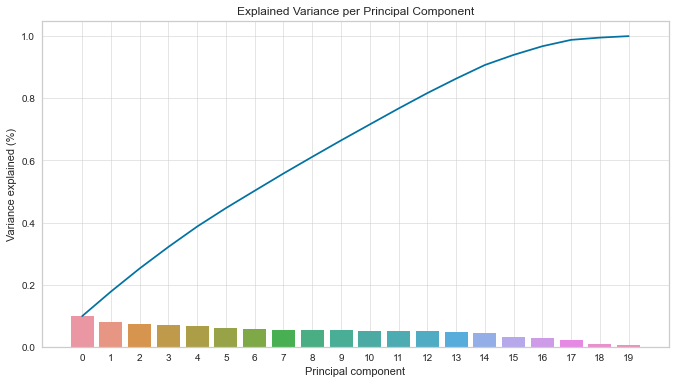

In [6]:
num_components = len(pca.explained_variance_ratio_)
ind = np.arange(num_components)
vals = pca.explained_variance_ratio_
cumvals = np.cumsum(vals)

plt.figure(figsize=(10,6))

ax = sns.barplot(ind, vals, ci=None)
ax2 = sns.lineplot(ind, cumvals, ci=None)
ax.grid(b=True, which='major', linewidth=0.5)

ax.set_xlabel('Principal component')
ax.set_ylabel('Variance explained (%)')
plt.title('Explained Variance per Principal Component');

In [7]:
num_components = len(cumvals[cumvals <= 0.8])

# Rerun PCA with components that explain 80% of the variance
pca = PCA(num_components)
X_pca = pca.fit_transform(profile_data)
X_pca = pd.DataFrame(X_pca)

X_pca.head()

,0,1,2,3,4,5,6,7,8,9,10,11
0,-0.894470,-0.697994,-0.462164,0.887238,-0.943939,-0.920857,-0.920791,-0.973747,0.553369,-0.000043,-0.681922,0.203261
1,-0.227553,1.623371,0.241775,2.275940,-0.696322,1.748791,-1.735835,-1.728822,-0.128344,0.184442,-0.880418,-0.276558
2,-1.489696,0.290229,1.904161,0.762686,0.031865,0.926132,0.650126,1.002273,0.220809,-3.621859,0.090123,1.442903
3,0.486449,1.056000,-0.491135,-1.864451,0.824925,0.726358,-0.346245,-0.969064,0.657544,-0.384583,-0.959516,0.951267
4,2.749085,-0.598853,-1.352985,1.349071,-0.073028,0.188176,-0.026345,-1.616996,0.390985,-0.139656,-1.305516,0.626482


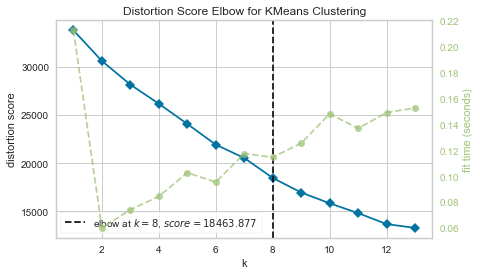

In [8]:
# Elbow method using distortion score
model = KMeans()
visualizer = kv(model, k=(1, 14))

visualizer.fit(X_pca)
visualizer.show();

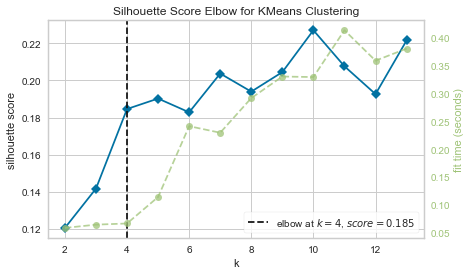

In [9]:
# Elbow method with silhoutte score
model = KMeans()
visualizer = kv(model, k=(2, 14), metric='silhouette')

visualizer.fit(X_pca)
visualizer.show();

In [10]:
model = KMeans(n_clusters=4).fit(X_pca)
kmeans_clusters = model.predict(X_pca)

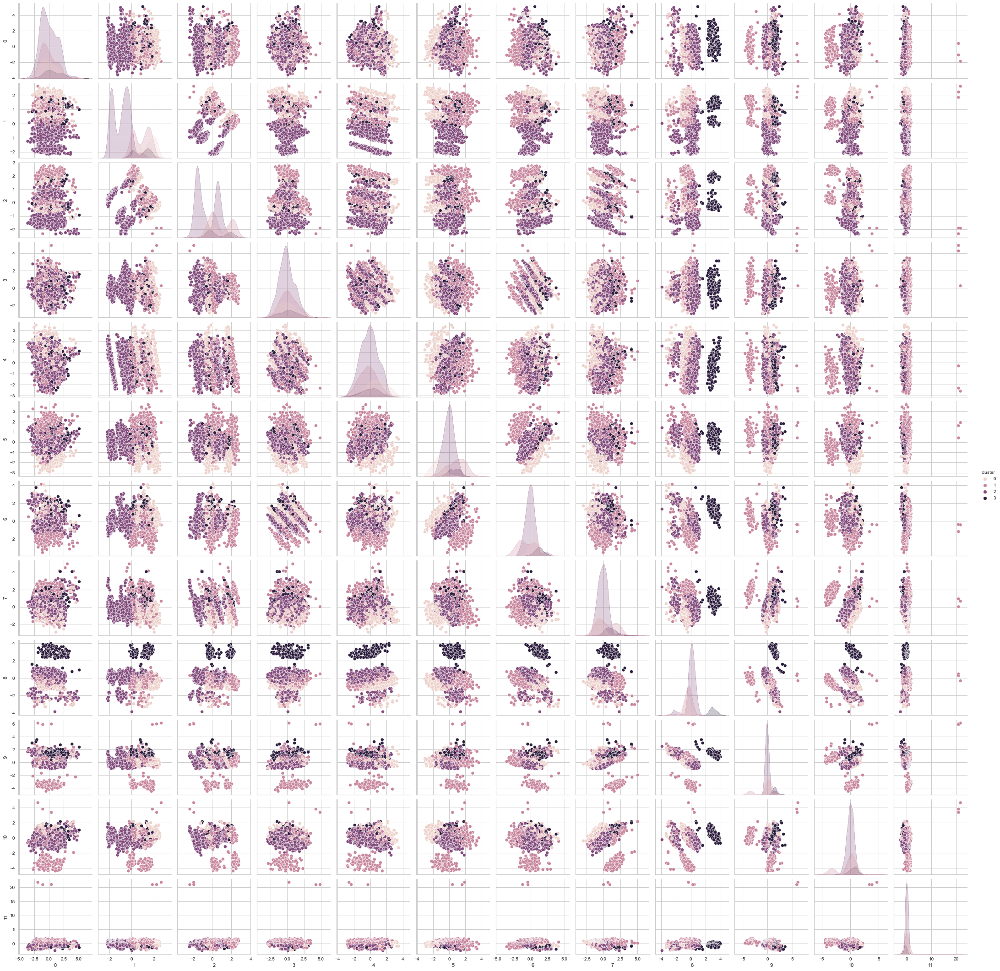

In [11]:
df = X_pca.copy()
df['cluster'] = kmeans_clusters
sns.pairplot(df, hue='cluster');

By using **KMeans**, we got 4 clusters

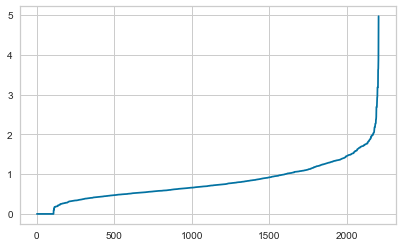

In [12]:
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(X_pca)
distances, indices = nbrs.kneighbors(X_pca)

distances = np.sort(distances, axis=0)
distances = distances[:, 1]
plt.plot(distances);

In [13]:
model = DBSCAN(eps=2.5, min_samples=25)
dbscan_clusters = model.fit_predict(X_pca)

print('Number of clusters:', len(np.unique(dbscan_clusters)))

Number of clusters: 7


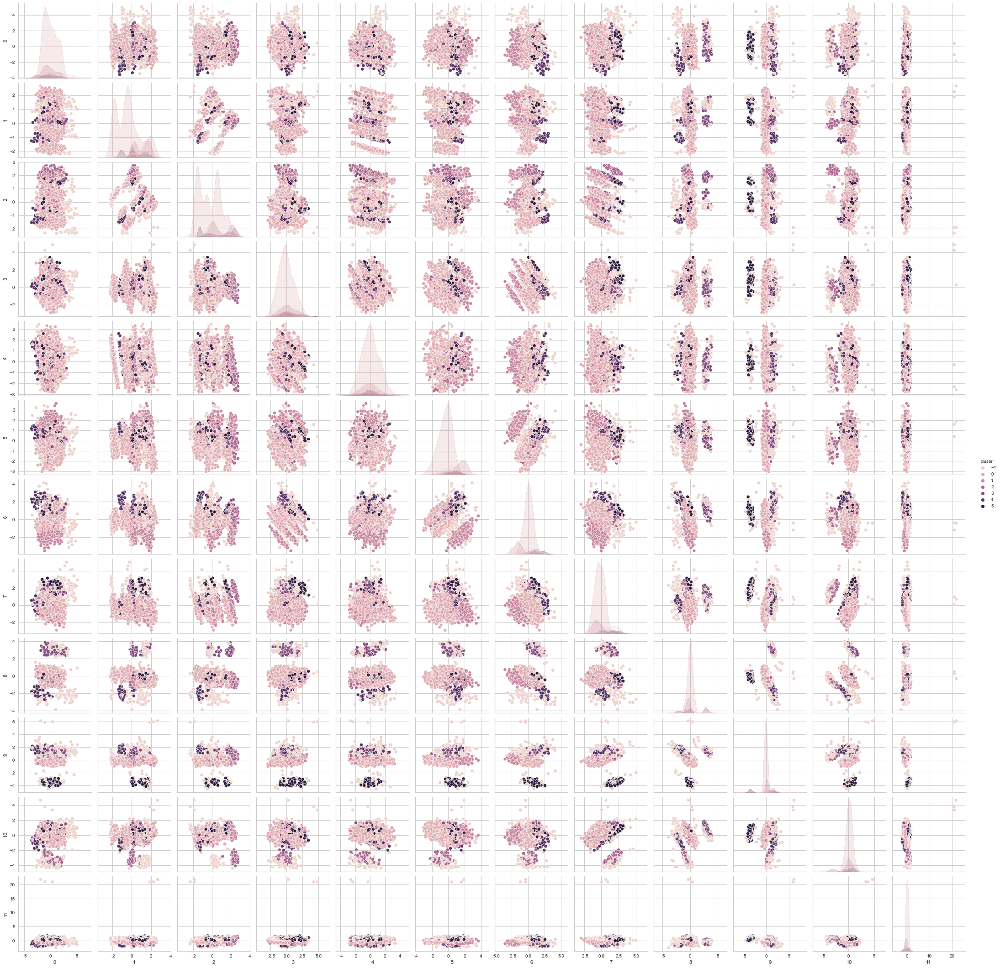

In [14]:
df = X_pca.copy()
df['cluster'] = dbscan_clusters
sns.pairplot(df, hue='cluster');

Number of clusters: 8


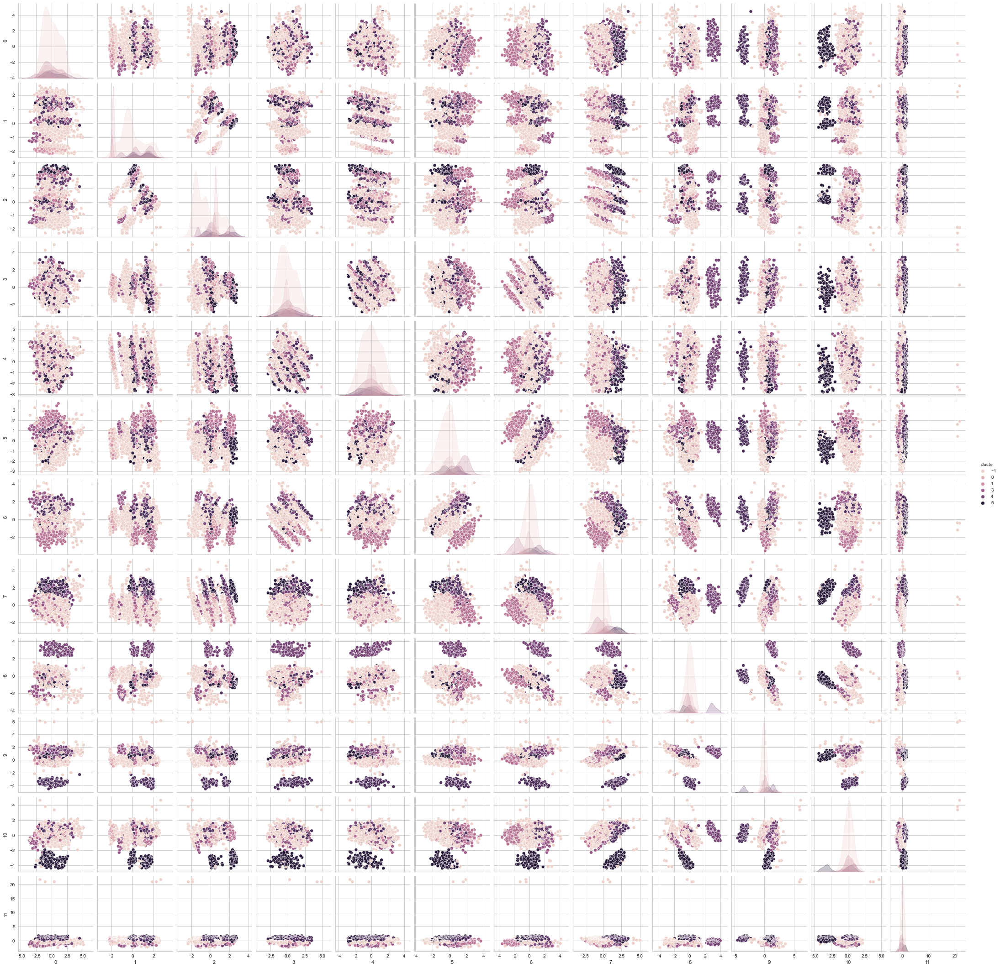

In [15]:
model = OPTICS(min_samples=25)
optics_clusters = model.fit_predict(X_pca)

print('Number of clusters:', len(np.unique(optics_clusters)))

df = X_pca.copy()
df['cluster'] = optics_clusters
sns.pairplot(df, hue='cluster');

For arbitrarily reason, we will choose KMeans model with 4 clusters for profile-based clustering

In [16]:
profile_model = KMeans(n_clusters=4).fit(X_pca)
joblib.dump(profile_model, '../models/profile_model.pkl')

['../models/profile_model.pkl']

In [17]:
df = data.copy()
df['cluster'] = kmeans_clusters
df.head()

,ohe_encoder__x0_Basic,ohe_encoder__x0_Master,ohe_encoder__x0_PhD,ohe_encoder__x1_Married,ohe_encoder__x1_Single,ohe_encoder__x1_Together,ohe_encoder__x1_Widow,ohe_encoder__x2_CA,ohe_encoder__x2_DE,ohe_encoder__x2_IN,...,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Response,Complain,Age,HasKid,HasTeen,cluster
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,50.0,0.0,0.0,2
1,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,1.0,1.0,0.0,59.0,0.0,0.0,1
2,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,62.0,0.0,1.0,1
3,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,53.0,1.0,1.0,1
4,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,31.0,1.0,0.0,2


In [18]:
df.to_csv('../data/processed/profile_based_data.csv', index=False)

### Clustering based on the amount of product purchased

In [19]:
product_cols = ['MntWines',
 'MntFruits',
 'MntMeatProducts',
 'MntFishProducts',
 'MntSweetProducts',
 'MntGoldProds']

product_data = data[product_cols]
product_data = StandardScaler().fit_transform(product_data)

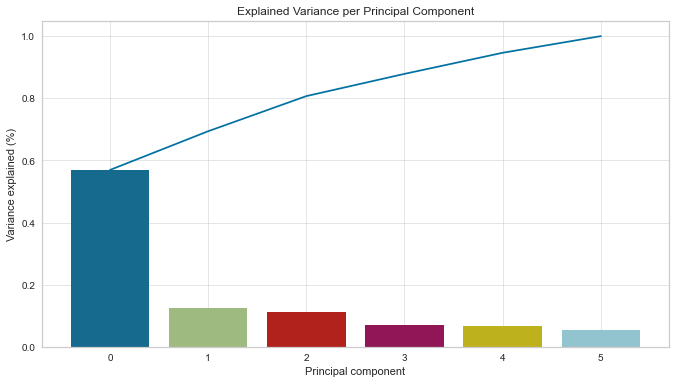

In [20]:
pca = PCA()
X_pca = pca.fit_transform(product_data)

num_components = len(pca.explained_variance_ratio_)
ind = np.arange(num_components)
vals = pca.explained_variance_ratio_
cumvals = np.cumsum(vals)

plt.figure(figsize=(10,6))

ax = sns.barplot(ind, vals, ci=None)
ax2 = sns.lineplot(ind, cumvals, ci=None)
ax.grid(b=True, which='major', linewidth=0.5)

ax.set_xlabel('Principal component')
ax.set_ylabel('Variance explained (%)')
plt.title('Explained Variance per Principal Component');

In [21]:
num_components = len(cumvals[cumvals <= 0.9])

# Rerun PCA with components that explain 90% of the variance
pca = PCA(num_components)
X_pca = pca.fit_transform(product_data)
X_pca = pd.DataFrame(X_pca)

X_pca.head()

,0,1,2,3
0,4.508631,-0.878535,2.740850,1.888334
1,-0.831150,0.777764,-0.312353,-0.038949
2,-1.102140,0.006682,0.142563,-0.174676
3,-1.811383,-0.354410,-0.066785,-0.037947
4,-1.287708,-0.188679,0.461698,-0.263457


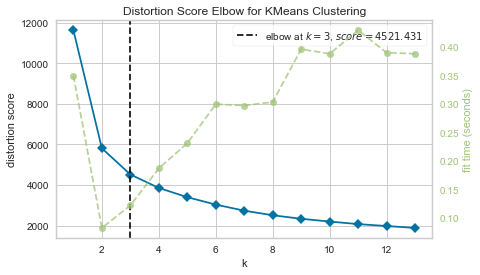

In [22]:
# Elbow method using distortion score
model = KMeans()
visualizer = kv(model, k=(1, 14))

visualizer.fit(X_pca)
visualizer.show();

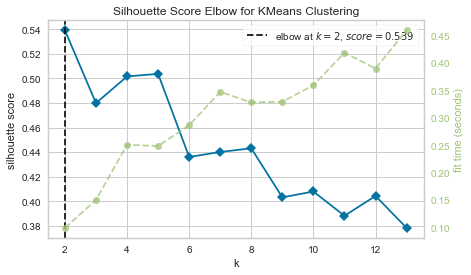

In [23]:
# Elbow method with silhoutte score
model = KMeans()
visualizer = kv(model, k=(2, 14), metric='silhouette')

visualizer.fit(X_pca)
visualizer.show();

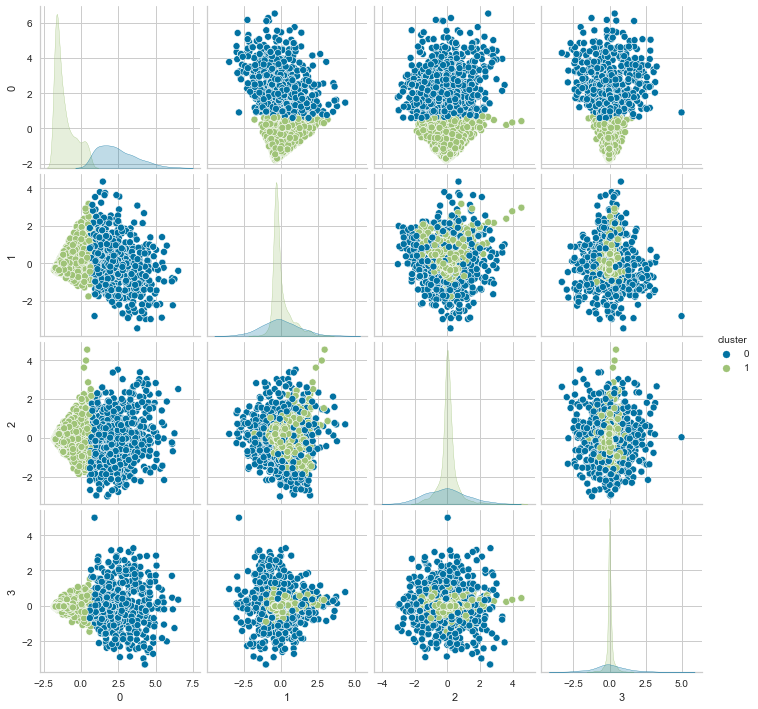

In [24]:
model = KMeans(n_clusters=2).fit(X_pca)
kmeans_clusters = model.predict(X_pca)

df = X_pca.copy()
df['cluster'] = kmeans_clusters
sns.pairplot(df, hue='cluster');

Number of clusters: 2


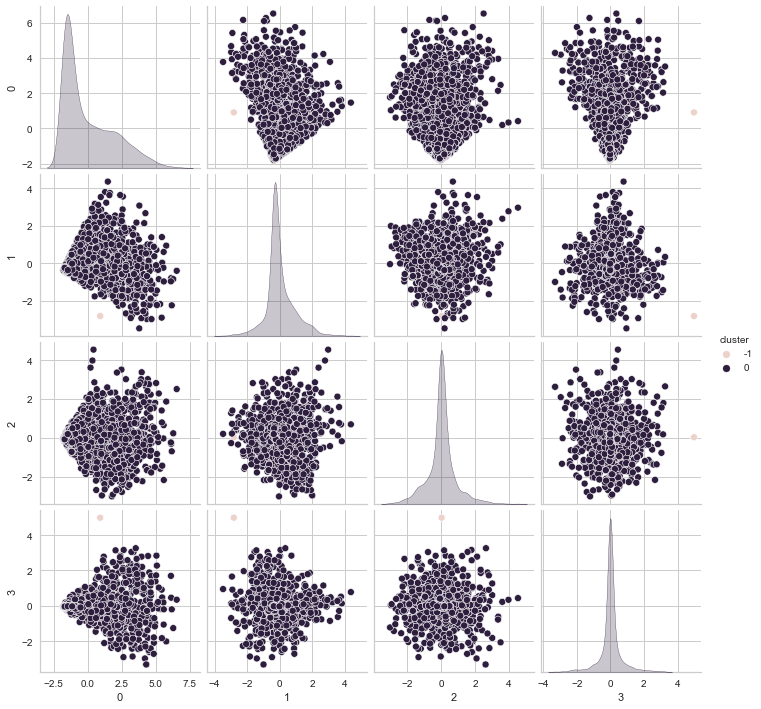

In [25]:
model = DBSCAN(eps=2.5, min_samples=50)
dbscan_clusters = model.fit_predict(X_pca)

print('Number of clusters:', len(np.unique(dbscan_clusters)))

df = X_pca.copy()
df['cluster'] = dbscan_clusters
sns.pairplot(df, hue='cluster');

Number of clusters: 2


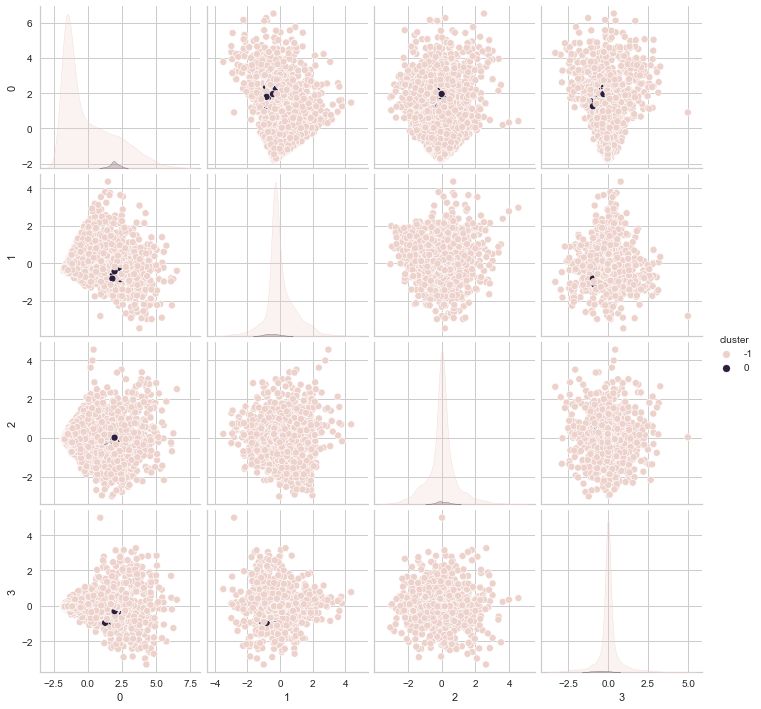

In [26]:
model = OPTICS(min_samples=25)
optics_clusters = model.fit_predict(X_pca)

print('Number of clusters:', len(np.unique(optics_clusters)))

df = X_pca.copy()
df['cluster'] = optics_clusters
sns.pairplot(df, hue='cluster');

For clustering based on the amount of product consumed, we will choose KMeans model with 2 clusters

In [27]:
product_model = KMeans(n_clusters=2).fit(X_pca)
joblib.dump(product_model, '../models/product_model.pkl')

['../models/product_model.pkl']

In [28]:
df = data.copy()
df['cluster'] = kmeans_clusters

df.to_csv('../data/processed/product_based_data.csv', index=False)

### Clustering based on purchasing behaviors

In [29]:
behavior_cols = ['NumDealsPurchases',
 'NumWebPurchases',
 'NumCatalogPurchases',
 'NumStorePurchases',
 'NumWebVisitsMonth']

behavior_data = data[behavior_cols]
behavior_data = StandardScaler().fit_transform(behavior_data)

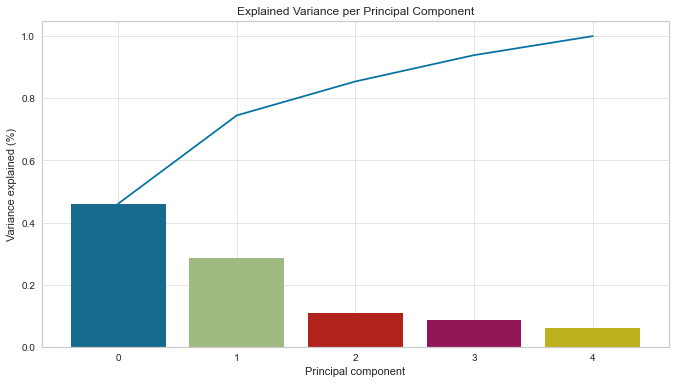

In [30]:
pca = PCA()
X_pca = pca.fit_transform(behavior_data)

num_components = len(pca.explained_variance_ratio_)
ind = np.arange(num_components)
vals = pca.explained_variance_ratio_
cumvals = np.cumsum(vals)

plt.figure(figsize=(10,6))

ax = sns.barplot(ind, vals, ci=None)
ax2 = sns.lineplot(ind, cumvals, ci=None)
ax.grid(b=True, which='major', linewidth=0.5)

ax.set_xlabel('Principal component')
ax.set_ylabel('Variance explained (%)')
plt.title('Explained Variance per Principal Component');

In [31]:
num_components = len(cumvals[cumvals <= 0.9])

# Rerun PCA with components that explain 90% of the variance
pca = PCA(num_components)
X_pca = pca.fit_transform(behavior_data)
X_pca = pd.DataFrame(X_pca)

X_pca.head()

,0,1,2
0,-1.124557,-1.396878,0.298000
1,-0.802303,-0.026830,-1.032161
2,-0.214497,-1.379774,0.260186
3,1.938378,-0.828931,-0.220311
4,1.457157,-0.113200,-0.297008


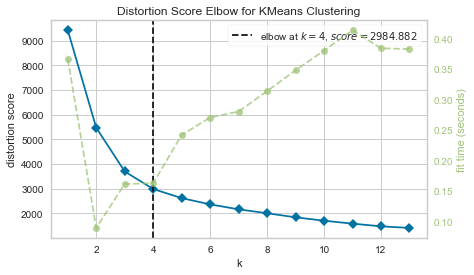

In [32]:
# Elbow method using distortion score
model = KMeans()
visualizer = kv(model, k=(1, 14))

visualizer.fit(X_pca)
visualizer.show();

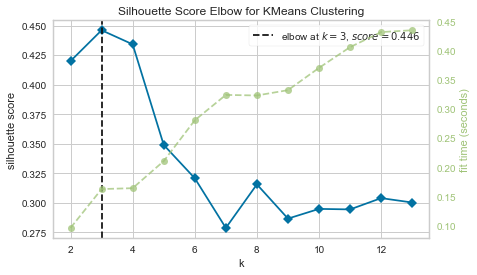

In [33]:
# Elbow method with silhoutte score
model = KMeans()
visualizer = kv(model, k=(2, 14), metric='silhouette')

visualizer.fit(X_pca)
visualizer.show();

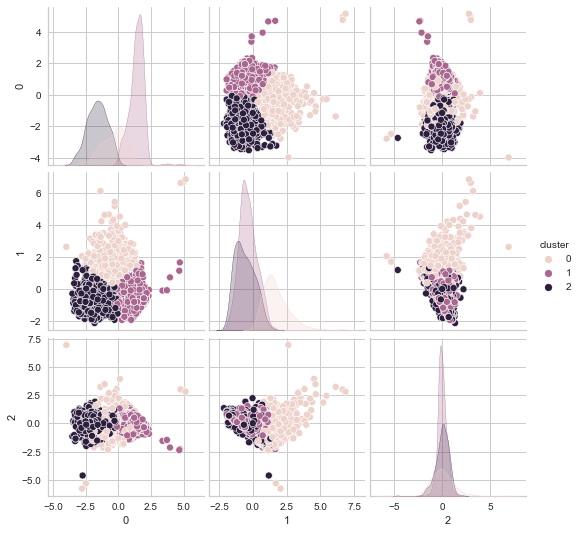

In [34]:
model = KMeans(n_clusters=3).fit(X_pca)
kmeans_clusters = model.predict(X_pca)

df = X_pca.copy()
df['cluster'] = kmeans_clusters
sns.pairplot(df, hue='cluster');

Number of clusters: 2


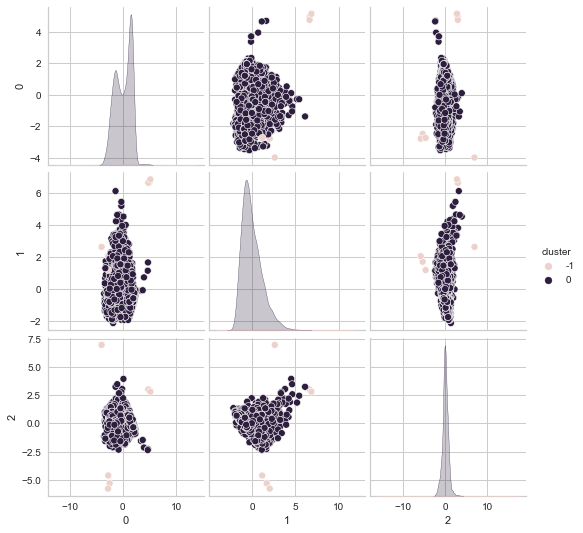

In [35]:
model = DBSCAN(eps=2.5, min_samples=50)
dbscan_clusters = model.fit_predict(X_pca)

print('Number of clusters:', len(np.unique(dbscan_clusters)))

df = X_pca.copy()
df['cluster'] = dbscan_clusters
sns.pairplot(df, hue='cluster');

Number of clusters: 3


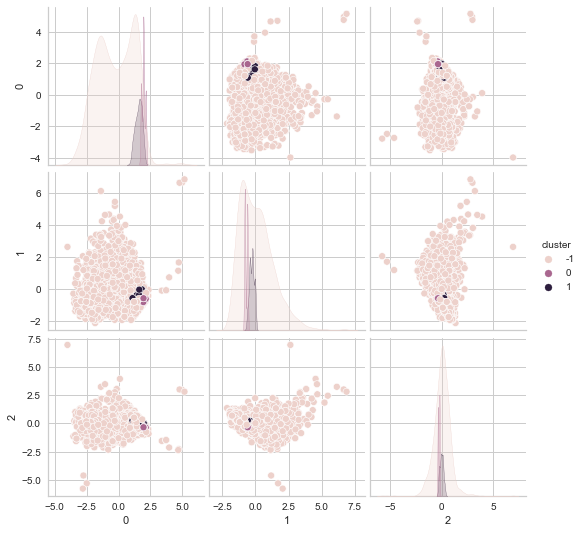

In [37]:
model = OPTICS(min_samples=100)
optics_clusters = model.fit_predict(X_pca)

print('Number of clusters:', len(np.unique(optics_clusters)))

df = X_pca.copy()
df['cluster'] = optics_clusters
sns.pairplot(df, hue='cluster');

In [38]:
behavior_model = KMeans(n_clusters=3).fit(X_pca)
joblib.dump(behavior_model, '../models/behavior_model.pkl')

['../models/behavior_model.pkl']

In [39]:
df = data.copy()
df['cluster'] = kmeans_clusters

df.to_csv('../data/processed/behavior_based_data.csv', index=False)

### Clustering based on marketing campaign performance

In [40]:
performance_cols = ['AcceptedCmp3',
 'AcceptedCmp4',
 'AcceptedCmp5',
 'AcceptedCmp1',
 'AcceptedCmp2',
 'Response',
 'Complain']

performance_data = data[performance_cols]
performance_data = StandardScaler().fit_transform(performance_data)

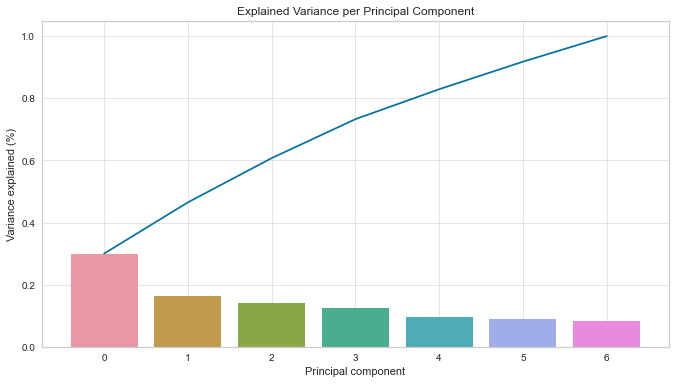

In [41]:
pca = PCA()
X_pca = pca.fit_transform(performance_data)

num_components = len(pca.explained_variance_ratio_)
ind = np.arange(num_components)
vals = pca.explained_variance_ratio_
cumvals = np.cumsum(vals)

plt.figure(figsize=(10,6))

ax = sns.barplot(ind, vals, ci=None)
ax2 = sns.lineplot(ind, cumvals, ci=None)
ax.grid(b=True, which='major', linewidth=0.5)

ax.set_xlabel('Principal component')
ax.set_ylabel('Variance explained (%)')
plt.title('Explained Variance per Principal Component');

In [42]:
num_components = len(cumvals[cumvals <= 0.9])

# Rerun PCA with components that explain 90% of the variance
pca = PCA(num_components)
X_pca = pca.fit_transform(performance_data)
X_pca = pd.DataFrame(X_pca)

X_pca.head()

,0,1,2,3,4
0,0.570816,0.824813,-0.168994,-0.183861,-1.553754
1,3.729034,-1.045566,0.461679,6.369147,1.361455
2,-0.655089,-0.213303,-0.082458,0.011201,0.143074
3,-0.655089,-0.213303,-0.082458,0.011201,0.143074
4,1.232505,3.698223,-0.565635,1.101930,-1.170152


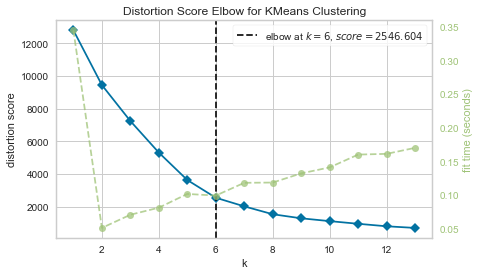

In [43]:
# Elbow method using distortion score
model = KMeans()
visualizer = kv(model, k=(1, 14))

visualizer.fit(X_pca)
visualizer.show();

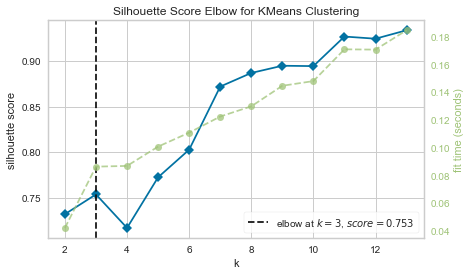

In [44]:
# Elbow method with silhoutte score
model = KMeans()
visualizer = kv(model, k=(2, 14), metric='silhouette')

visualizer.fit(X_pca)
visualizer.show();

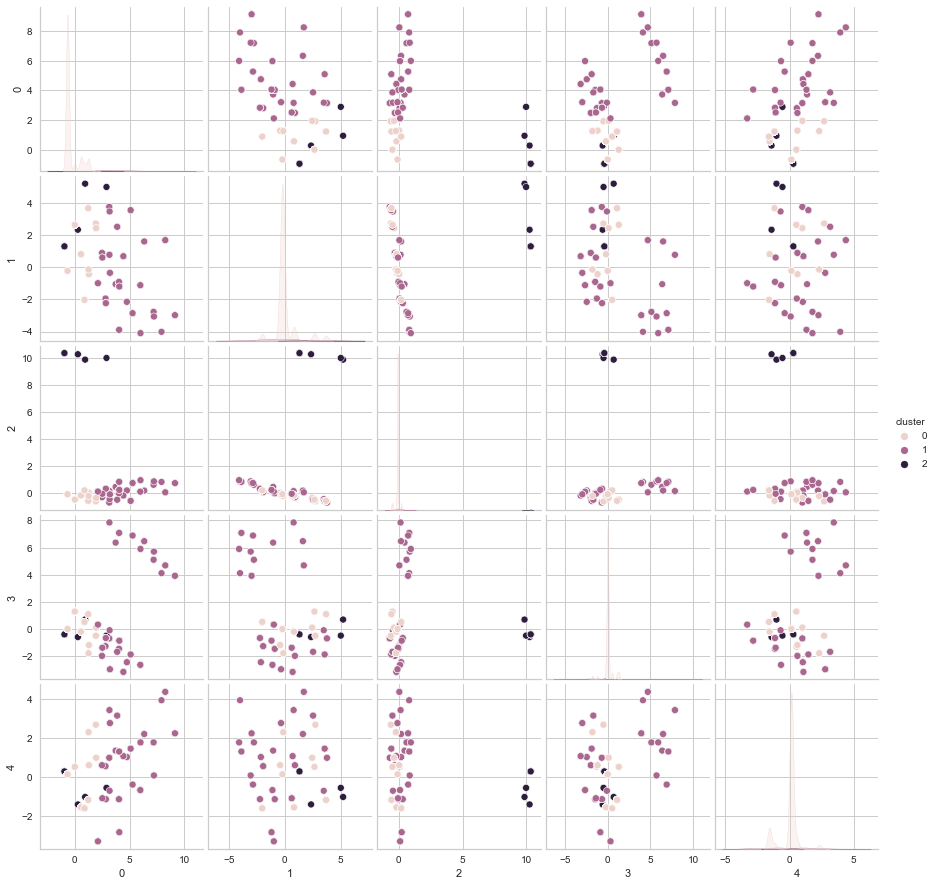

In [45]:
model = KMeans(n_clusters=3).fit(X_pca)
kmeans_clusters = model.predict(X_pca)

df = X_pca.copy()
df['cluster'] = kmeans_clusters
sns.pairplot(df, hue='cluster');

Number of clusters: 3


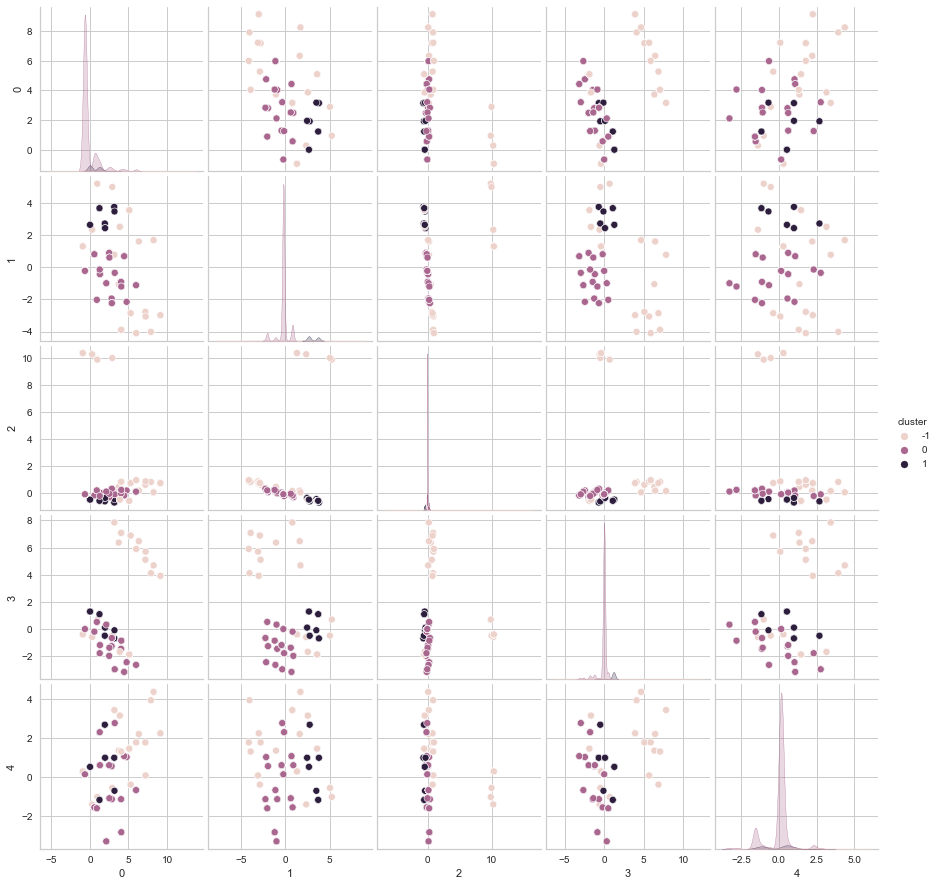

In [46]:
model = DBSCAN(eps=2.5, min_samples=50)
dbscan_clusters = model.fit_predict(X_pca)

print('Number of clusters:', len(np.unique(dbscan_clusters)))

df = X_pca.copy()
df['cluster'] = dbscan_clusters
sns.pairplot(df, hue='cluster');

Number of clusters: 4


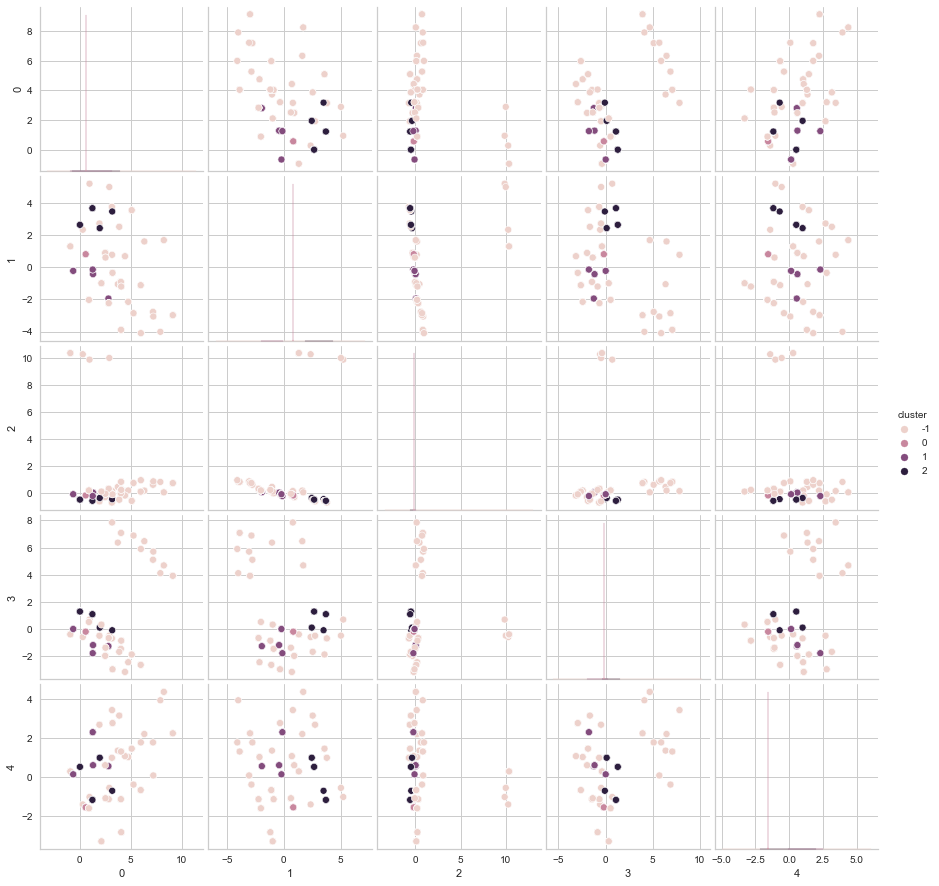

In [47]:
model = OPTICS(min_samples=100)
optics_clusters = model.fit_predict(X_pca)

print('Number of clusters:', len(np.unique(optics_clusters)))

df = X_pca.copy()
df['cluster'] = optics_clusters
sns.pairplot(df, hue='cluster');

In [48]:
performance_model = KMeans(n_clusters=3).fit(X_pca)
joblib.dump(performance_model, '../models/performance_model.pkl')

['../models/performance_model.pkl']

In [49]:
df = data.copy()
df['cluster'] = kmeans_clusters

df.to_csv('../data/processed/performance_based_data.csv', index=False)